In [1]:
!pip install -q git+https://github.com/facebookresearch/detectron2.git
# !pip install -U detectron2


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 39.1 MB/s eta 0:00:00


In [2]:
!pip uninstall cupy
!pip install cupy-cuda11x 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 15.6 MB/s eta 0:00:00


In [4]:
# You need to handle polygon segmentation data from VGG JSON format
# The key changes will be in the region processing part
import os
import json
import shutil
from PIL import Image
from tqdm import tqdm
import numpy as np
from sklearn.model_selection import train_test_split

# The rest of your config stays the same
annotations_folder = '/kaggle/input/cottonweeddet3/CottonWeedDet3/annotations'
images_folder = '/kaggle/input/cottonweeddet3/CottonWeedDet3/images'
output_folder = '/kaggle/working/coco_dataset_masked'
output_images_folder = os.path.join(output_folder, "images")

# Create output folders
os.makedirs(output_folder, exist_ok=True)
os.makedirs(os.path.join(output_images_folder, "train"), exist_ok=True)
os.makedirs(os.path.join(output_images_folder, "val"), exist_ok=True)

# Classes
class_map = {
    'carpetweed': 0,
    'morningglory': 1,
    'palmer_amaranth': 2
}
categories = [{"id": v, "name": k, "supercategory": "weed"} for k, v in class_map.items()]

# Step 1: Collect all image-label data with both bboxes and segmentation masks
image_data = []

for json_file in os.listdir(annotations_folder):
    if not json_file.endswith('.json'):
        continue

    with open(os.path.join(annotations_folder, json_file)) as f:
        data = json.load(f)

    for item_key in data:
        item = data[item_key]
        filename = item['filename']
        regions = item['regions']
        image_path = os.path.join(images_folder, filename)

        if not os.path.exists(image_path):
            print(f"[⚠️ Skipping] Image not found: {filename}")
            continue

        try:
            with Image.open(image_path) as img:
                width, height = img.size
        except Exception as e:
            print(f"[❌ Error opening] {filename}: {e}")
            continue

        annotations = []
        for region in regions:
            shape_attr = region['shape_attributes']
            region_attr = region['region_attributes']
            
            class_name = region_attr.get('class', '').lower()
            if class_name not in class_map:
                continue

            # Handle different annotation types
            shape_type = shape_attr['name']
            
            if shape_type == 'rect':
                # For rectangle regions, create bbox and polygon segmentation
                x = shape_attr['x']
                y = shape_attr['y']
                w = shape_attr['width']
                h = shape_attr['height']
                
                # Create rectangle polygon from bbox
                segmentation = [[x, y, x + w, y, x + w, y + h, x, y + h]]
                
                annotation = {
                    "category_id": class_map[class_name],
                    "bbox": [x, y, w, h],
                    "area": w * h,
                    "segmentation": segmentation
                }
                annotations.append(annotation)
                
            elif shape_type == 'polygon':
                # For polygon regions, use points directly
                all_points_x = shape_attr.get('all_points_x', [])
                all_points_y = shape_attr.get('all_points_y', [])
                
                # Check if we have valid points
                if len(all_points_x) < 3 or len(all_points_y) < 3:
                    continue
                
                # Flatten the points into [x1, y1, x2, y2, ...] format
                points = []
                for x, y in zip(all_points_x, all_points_y):
                    points.extend([x, y])
                
                # Calculate the bounding box from the polygon
                x_min, x_max = min(all_points_x), max(all_points_x)
                y_min, y_max = min(all_points_y), max(all_points_y)
                
                bbox = [x_min, y_min, x_max - x_min, y_max - y_min]
                area = (x_max - x_min) * (y_max - y_min)  # Approximate area
                
                annotation = {
                    "category_id": class_map[class_name],
                    "bbox": bbox,
                    "area": area,
                    "segmentation": [points]  # List of polygons, each as a flattened list of coordinates
                }
                annotations.append(annotation)

        if annotations:
            image_data.append({
                "file_name": filename,
                "width": width,
                "height": height,
                "annotations": annotations
            })

# Step 2: Split into train and val (unchanged)
# Extract a label for stratification (just first class per image for simplicity)
image_labels = []
for img in image_data:
    # Get the first category ID for stratification
    first_class_id = img['annotations'][0]['category_id']
    image_labels.append(first_class_id)

# Stratified split
train_imgs, val_imgs = train_test_split(
    image_data, 
    test_size=0.2, 
    random_state=42, 
    stratify=image_labels
)

splits = {
    "train": train_imgs,
    "val": val_imgs
}

# Step 3: Write COCO-style JSONs with segmentation and copy images
def create_coco_json(data_split, split_name):
    coco = {
        "images": [],
        "annotations": [],
        "categories": categories
    }

    ann_id = 1
    for img_id, item in enumerate(tqdm(data_split), start=1):
        new_img_path = os.path.join(output_images_folder, split_name, item["file_name"])
        old_img_path = os.path.join(images_folder, item["file_name"])

        # Copy image to appropriate split folder
        shutil.copyfile(old_img_path, new_img_path)

        coco["images"].append({
            "id": img_id,
            "file_name": f"{split_name}/{item['file_name']}",
            "width": item["width"],
            "height": item["height"]
        })

        for ann in item["annotations"]:
            coco["annotations"].append({
                "id": ann_id,
                "image_id": img_id,
                "category_id": ann["category_id"],
                "bbox": ann["bbox"],
                "area": ann["area"],
                "iscrowd": 0,
                "segmentation": ann["segmentation"]  # Include segmentation data
            })
            ann_id += 1

    # Save annotations
    json_path = os.path.join(output_folder, f"annotations_{split_name}.json")
    with open(json_path, 'w') as f:
        json.dump(coco, f, indent=4)
    print(f"✅ COCO annotations saved to: {json_path}")

# Generate both splits
create_coco_json(splits["train"], "train")
create_coco_json(splits["val"], "val")

100%|██████████| 678/678 [00:42<00:00, 15.81it/s]


✅ COCO annotations saved to: /kaggle/working/coco_dataset_masked/annotations_train.json


100%|██████████| 170/170 [00:11<00:00, 14.95it/s]

✅ COCO annotations saved to: /kaggle/working/coco_dataset_masked/annotations_val.json


In [5]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Function to safely remove a dataset + its metadata
def unregister_dataset(name):
    if name in DatasetCatalog.list():
        DatasetCatalog.remove(name)
    if name in MetadataCatalog.list():
        MetadataCatalog.remove(name)

# Unregister if already exists
unregister_dataset("cottonweed_train")
unregister_dataset("cottonweed_val")

# Register again with the correct JSON and image paths
from detectron2.data.datasets import register_coco_instances

register_coco_instances(
    "cottonweed_train",
    {},
    "/kaggle/working/coco_dataset_masked/annotations_train.json",
    "/kaggle/working/coco_dataset_masked/images/"
)

register_coco_instances(
    "cottonweed_val",
    {},
    "/kaggle/working/coco_dataset_masked/annotations_val.json",
    "/kaggle/working/coco_dataset_masked/images/"
    
)
# Confirm registration
if "cottonweed_train" in DatasetCatalog.list() and "cottonweed_val" in DatasetCatalog.list():
    print("Success ✅")
else:
    print("Failed")

# Check if registration was successful
print("Registered Datasets:")
print(DatasetCatalog.list())

# Optional: Print sample from each dataset
for name in ["cottonweed_train", "cottonweed_val"]:
    print(f"\n{name} Metadata:")
    metadata = MetadataCatalog.get(name)
    print(metadata)

    dataset_dicts = DatasetCatalog.get(name)
    print(f"Sample from {name}:")
    if dataset_dicts:
        print(dataset_dicts[0])
    else:
        print("No data found in this dataset.")



Success ✅
Registered Datasets:
['coco_2014_train', 'coco_2014_val', 'coco_2014_minival', 'coco_2014_valminusminival', 'coco_2017_train', 'coco_2017_val', 'coco_2017_test', 'coco_2017_test-dev', 'coco_2017_val_100', 'keypoints_coco_2014_train', 'keypoints_coco_2014_val', 'keypoints_coco_2014_minival', 'keypoints_coco_2014_valminusminival', 'keypoints_coco_2017_train', 'keypoints_coco_2017_val', 'keypoints_coco_2017_val_100', 'coco_2017_train_panoptic_separated', 'coco_2017_train_panoptic_stuffonly', 'coco_2017_train_panoptic', 'coco_2017_val_panoptic_separated', 'coco_2017_val_panoptic_stuffonly', 'coco_2017_val_panoptic', 'coco_2017_val_100_panoptic_separated', 'coco_2017_val_100_panoptic_stuffonly', 'coco_2017_val_100_panoptic', 'lvis_v1_train', 'lvis_v1_val', 'lvis_v1_test_dev', 'lvis_v1_test_challenge', 'lvis_v0.5_train', 'lvis_v0.5_val', 'lvis_v0.5_val_rand_100', 'lvis_v0.5_test', 'lvis_v0.5_train_cocofied', 'lvis_v0.5_val_cocofied', 'cityscapes_fine_instance_seg_train', 'cityscape

# mask rcnn

In [ ]:
import os
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader


# Set up metadata
weed_metadata = MetadataCatalog.get("cottonweed_train")
weed_metadata.thing_classes = ["carpetweed", "morningglory", "palmer_amaranth"]

# Config setup
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))

# Dataset names (already registered above)
cfg.DATASETS.TRAIN = ("cottonweed_train",)
cfg.DATASETS.TEST = ("cottonweed_val",)
cfg.DATALOADER.NUM_WORKERS = 2

# Use pretrained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")

# Training hyperparameters
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 2000        # Adjust based on dataset size
cfg.SOLVER.STEPS = []             # No LR decay
cfg.SOLVER.CHECKPOINT_PERIOD = 200

# Number of classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # carpetweed, morningglory, palmer_amaranth

# Make sure mask head is enabled
cfg.MODEL.MASK_ON = True

# Score threshold at test time (used for inference and evaluation)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05

# AMP (Automatic Mixed Precision)
cfg.SOLVER.AMP.ENABLED = True

# Output directory
cfg.OUTPUT_DIR = "/kaggle/working/output_mask_rcnn"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Save config to output folder
with open(os.path.join(cfg.OUTPUT_DIR, "config.yaml"), "w") as f:
    f.write(cfg.dump())

# Create a custom trainer class with evaluation capabilities
class TrainerWithEval(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

# Start training with the custom trainer
trainer = TrainerWithEval(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

# Load best model after training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Create evaluator and test data loader
evaluator = COCOEvaluator("cottonweed_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "cottonweed_val")

# Evaluate and print metrics
metrics = inference_on_dataset(trainer.model, val_loader, evaluator)
print(metrics)


/usr/local/lib/python3.10/dist-packages/detectron2/engine/train_loop.py:474: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  grad_scaler = GradScaler()
model_final_2d9806.pkl: 431MB [00:01, 259MB/s]                           
/usr/local/lib/python3.10/dist-packages/detectron2/engine/train_loop.py:493: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(dtype=self.precision):
/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.543
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.544
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.462
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.691
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.705
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:

/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

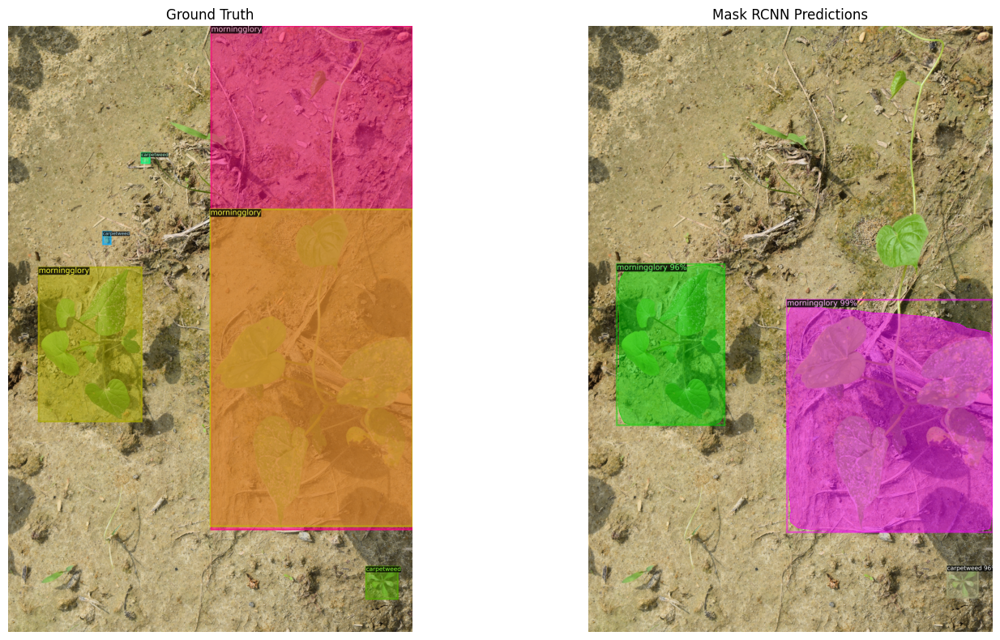

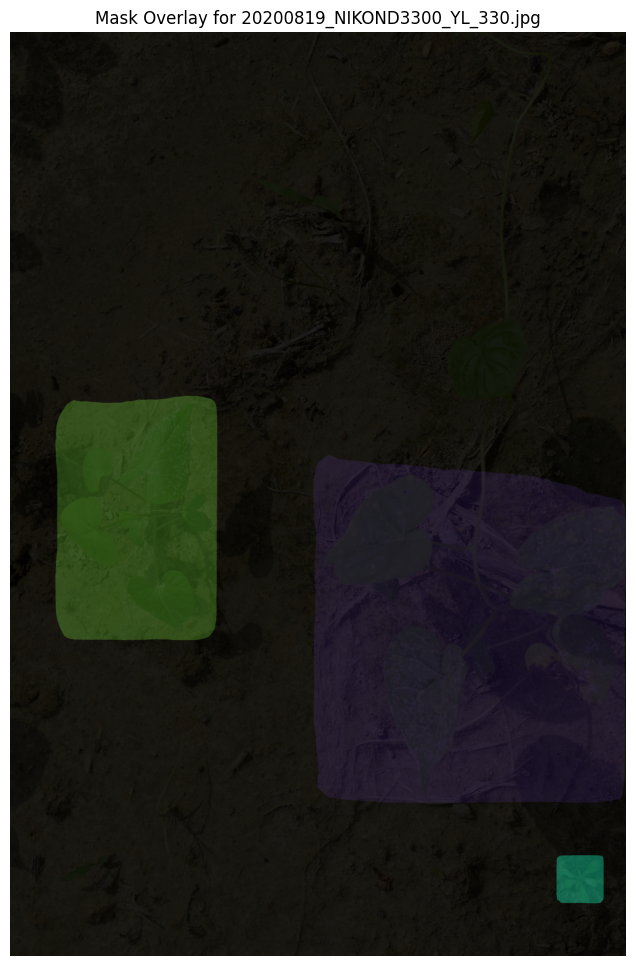

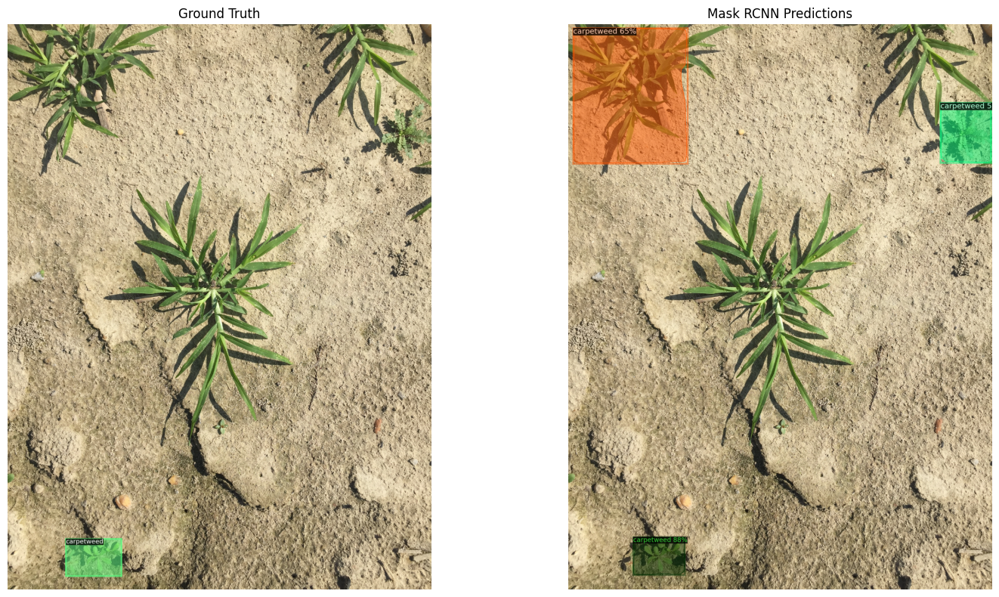

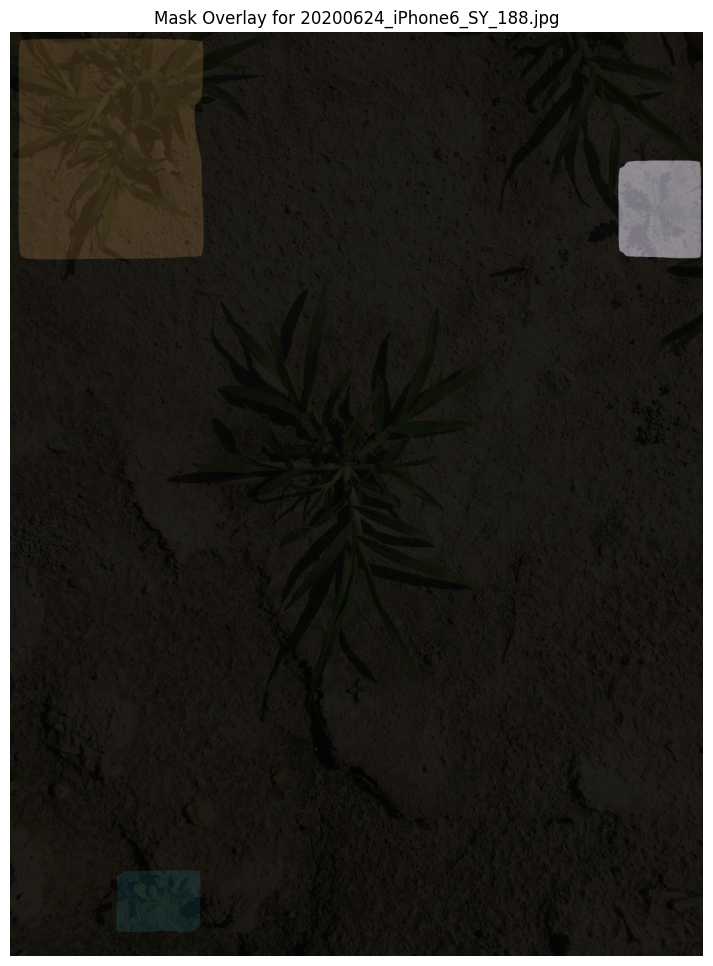

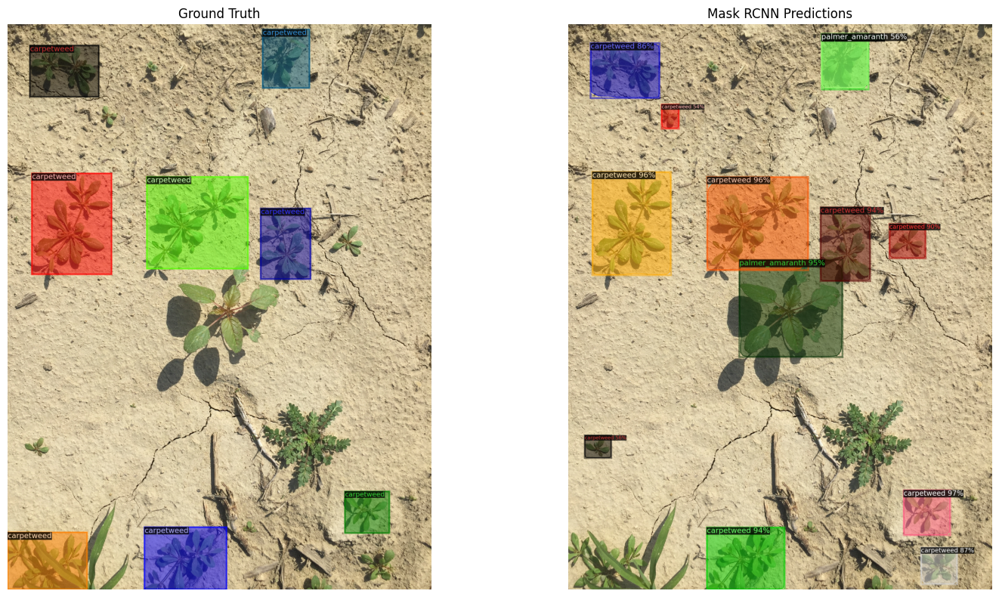

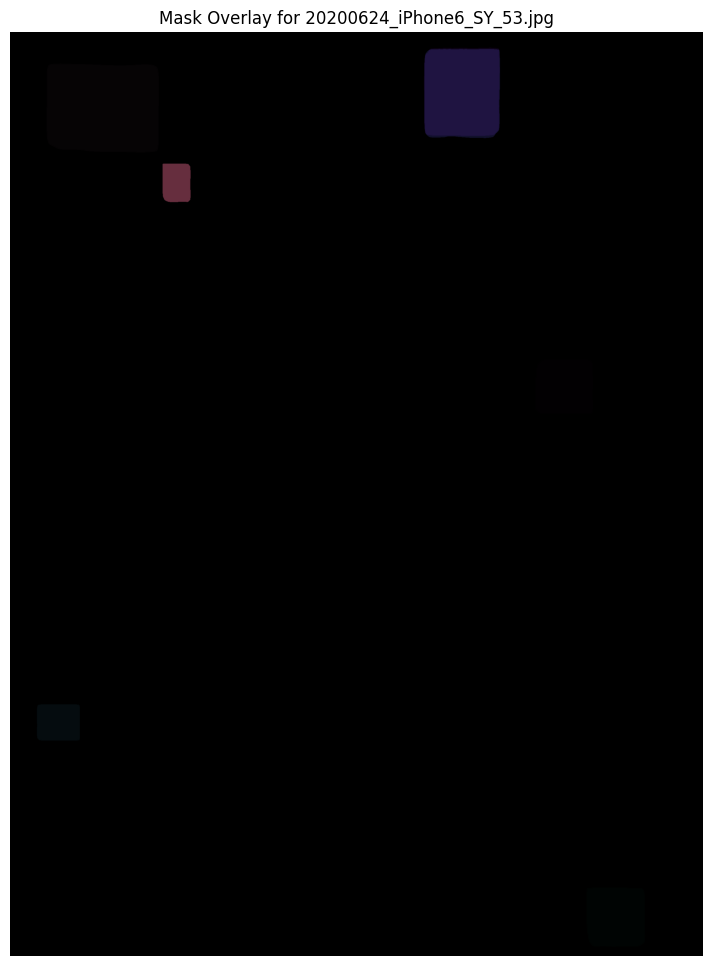

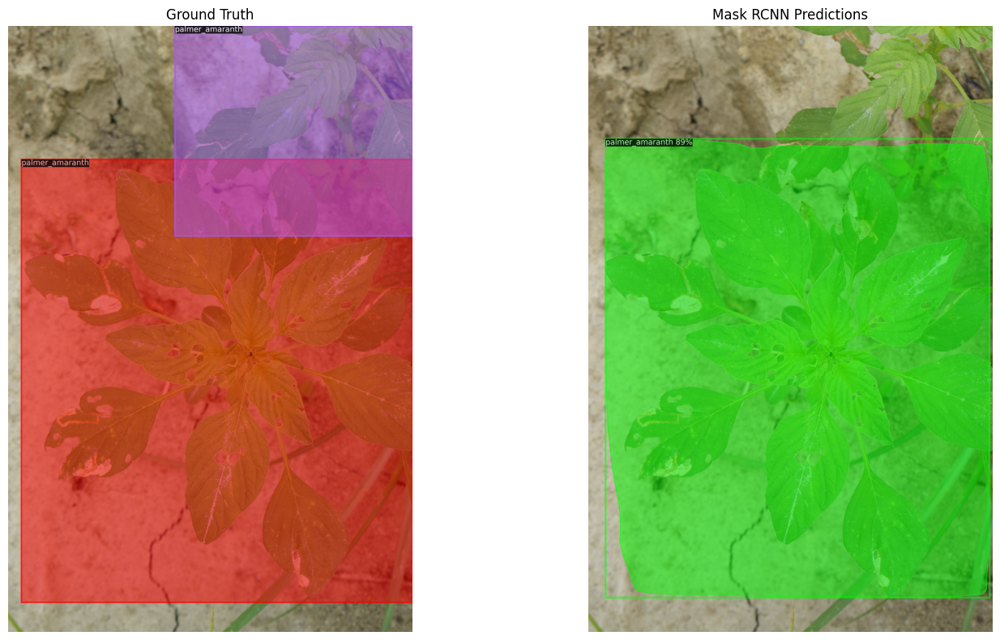

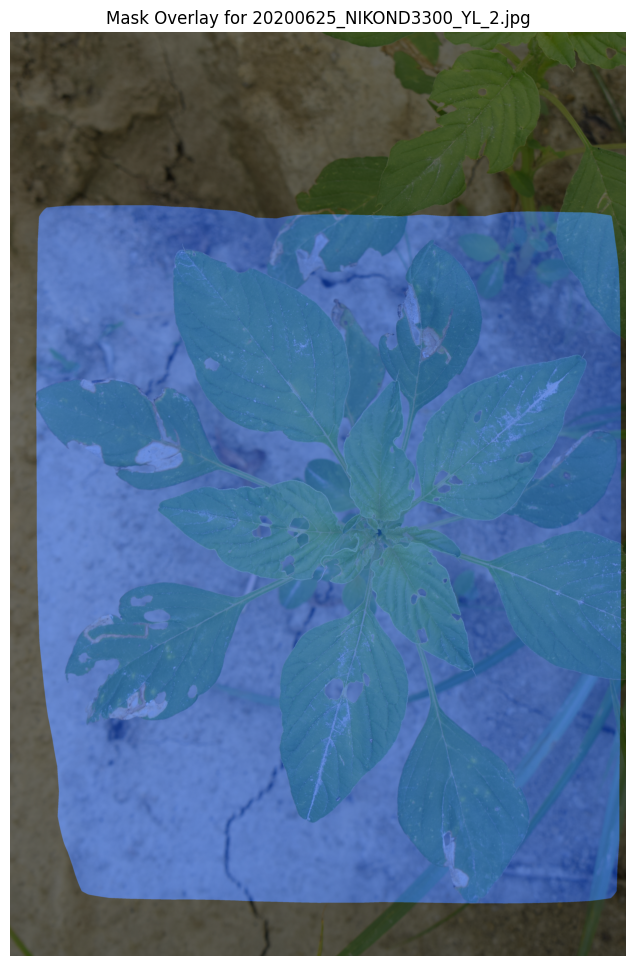

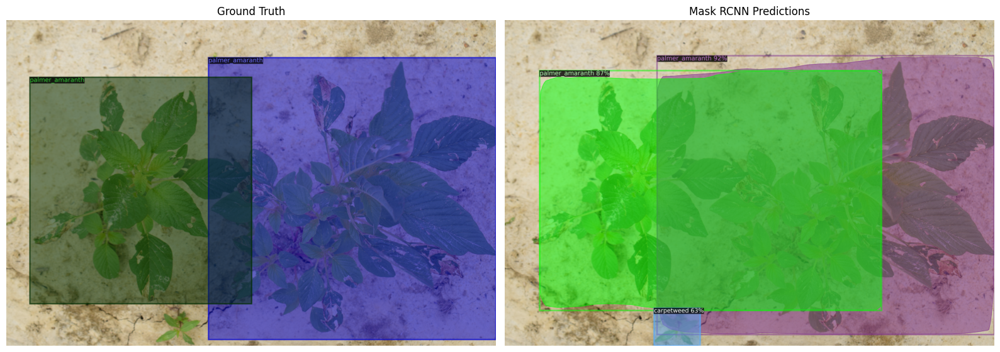

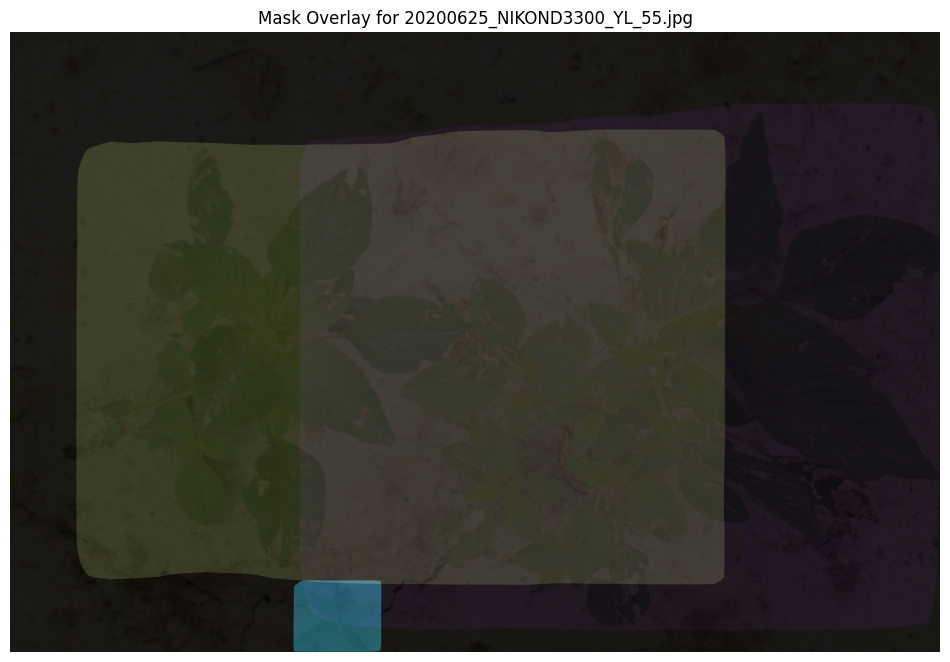

In [7]:
# === Visualization with Better NMS Settings ===
import random
import matplotlib.pyplot as plt
import cv2
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultPredictor

# Register COCO dataset for visualization
dataset_name = "cottonweed_val"
val_json = "/kaggle/working/coco_dataset_masked/annotations_val.json"
val_img_dir = "/kaggle/working/coco_dataset_masked/images/"
register_coco_instances(dataset_name, {}, val_json, val_img_dir)

# Set metadata classes (important for visualization)
metadata = MetadataCatalog.get(dataset_name)
metadata.thing_classes = ["carpetweed", "morningglory", "palmer_amaranth"]

# Update config for inference with optimized NMS settings
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = (dataset_name,)

# Critical NMS parameters to reduce overlapping boxes
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.5  # Higher values keep more boxes, lower merges more
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Minimum confidence to consider a detection
cfg.MODEL.RPN.NMS_THRESH = 0.7  # NMS threshold for Region Proposal Network

# Make sure mask head is enabled for visualization
cfg.MODEL.MASK_ON = True

predictor = DefaultPredictor(cfg)

# Metadata & dataset
dataset_dicts = DatasetCatalog.get(dataset_name)

# Compare 5 random images
for d in random.sample(dataset_dicts, 5):
    file_path = d["file_name"]
    im = cv2.imread(file_path)
    
    # Prediction with improved NMS
    outputs = predictor(im)
    
    # Get instances with both boxes and masks
    instances = outputs["instances"]
    
    # Visualize predictions with masks
    v_pred = Visualizer(im[:, :, ::-1], metadata=metadata, scale=0.8)
    pred_vis = v_pred.draw_instance_predictions(instances.to("cpu")).get_image()
    
    # Ground Truth visualization with masks
    v_gt = Visualizer(im[:, :, ::-1], metadata=metadata, scale=0.8)
    gt_vis = v_gt.draw_dataset_dict(d).get_image()
    
    # Show side-by-side
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    axs[0].imshow(gt_vis)
    axs[0].set_title("Ground Truth")
    axs[0].axis("off")
    
    axs[1].imshow(pred_vis)
    axs[1].set_title("Mask RCNN Predictions")
    axs[1].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # Optional: Save the visualization
    fig.savefig(f"/kaggle/working/output_mask_rcnn/comparison_{os.path.basename(file_path)}")
    
    # Show mask-specific visualization (optional)
    if len(instances) > 0 and "pred_masks" in instances._fields:
        plt.figure(figsize=(12, 12))
        plt.imshow(im[:, :, ::-1])
        
        # Overlay just the masks with different colors per class
        mask_array = instances.pred_masks.cpu().numpy()
        class_ids = instances.pred_classes.cpu().numpy()
        
        for i, (mask, class_id) in enumerate(zip(mask_array, class_ids)):
            color = [random.random() for _ in range(3)]  # Random color for each mask
            mask_img = np.zeros_like(im)
            mask_img[:, :, 0] = mask * color[0] * 255
            mask_img[:, :, 1] = mask * color[1] * 255
            mask_img[:, :, 2] = mask * color[2] * 255
            
            # Overlay with transparency
            alpha = 0.5
            cv2.addWeighted(mask_img, alpha, im, 1 - alpha, 0, im)
        
        plt.imshow(im[:, :, ::-1])
        plt.axis("off")
        plt.title(f"Mask Overlay for {os.path.basename(file_path)}")
        plt.savefig(f"/kaggle/working/output_mask_rcnn/masks_only_{os.path.basename(file_path)}")
        plt.show()

In [8]:
# rm -r /kaggle/working/output_cottonweed